<a href="https://colab.research.google.com/github/pbrandao26/EngenhariaDeDados-MVP-2023/blob/main/5_1_analises_e_graficos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Análises e Gráficos

Neste notebook, obtido através da integração do Google Collab com o o BigQuery, vamos realizar toda a parte de análises e geração de gráficos. Vamos tentar responder todas as perguntas levantadas no início do trabalho e também chegar a novas indagações.

Cada query realizada no BigQuery foi trazida para este notebook em formato de DataFrame, tornando possível a geração de gráficos e análises estatísticas com o Python.

No total, foram feitas 4 consultas, que agregaram os dados das tabelas dimensões e fatos de acordo com a necessidade e o escopo da pergunta a ser respondida:


*   Variação do valor médio de compra ou venda dos jogadores de acordo com a posição ao longo do tempo;
*   Variação do valor médio de compra ou venda dos jogadores de acordo com a idade ao longo do tempo;
*   Valorização e poder aquisitivo das ligas analisadas ao longo do tempo;
*   Variação do valor de compra ou venda dos jogadores agregado aos seus dados de performance, por jogador, liga e ano.




In [1]:
# @title Setup
#Aqui realizamos o setup da minha conta no google cloud, fazendo a conexão com o meu projeto.
from google.colab import auth
from google.cloud import bigquery
from google.colab import data_table

project = 'mvp-futebol-398700' # Project ID
location = 'US' # Location
client = bigquery.Client(project=project, location=location)
data_table.enable_dataframe_formatter()
auth.authenticate_user()

#Variação do Valor Médio de Compra ou Venda dos Jogadores de Acordo com a Posição ao Longo do Tempo:

Neste estudo, nosso objetivo é entender a interseção entre o valor de transferência dos jogadores e a posição que ocupam em campo. Sabe-se que o futebol, como qualquer outro mercado, tem suas tendências e variações. No entanto, levantamos a seguinte questão: até que ponto a posição de um jogador influencia seu valor de mercado?

Ao considerar os valores médios de compra ou venda, buscamos identificar padrões e tendências ao longo dos anos. Será que atacantes sempre foram mais valorizados do que defensores? Ou houve períodos em que goleiros ou meio-campistas tiveram um pico em sua avaliação?

Este estudo não só fornecerá insights sobre a dinâmica do mercado de transferências ao longo do tempo, mas também fomentará questões sobre a evolução das táticas e estratégias no futebol. Por exemplo, um aumento no valor dos defensores pode indicar uma era em que estratégias defensivas dominaram o jogo.

Através desta análise, esperamos desvendar algumas nuances do mercado de transferências e como a posição em campo, juntamente com o período de tempo, molda os valores de transferência dos jogadores.

## Referência ao job do SQL para consulta de valor de transferência dos jogadores de acordo com a posição
Foi usando o ```jobs.query```
[method](https://cloud.google.com/bigquery/docs/reference/rest/v2/jobs/query)
retornando a sintaxe do SQL direto do job.
Definimos o job de acordo com o ID da query gerada no BigQuery e chamamos ele aqui. Este método será novamente aplicado mais a frente para as outras queries, fazendo com que seja possível extrair os dados das próximas consultas SQL também.

In [5]:
# Atribuindo o job a variável.

job = client.get_job('bquxjob_9af3e54_18aec1fd733') # ID do job inserido com base nos resultados da consulta.
print(job.query)

WITH AggregatedData AS (
    SELECT 
        CASE 
            WHEN djog.Pos = 'Atacante' THEN 'Centroavante'
            WHEN djog.Pos = 'Defensores' OR djog.Pos = 'Líbero' THEN 'Zagueiro'
            WHEN djog.Pos = 'Meio-Campo' THEN 'Meia Ofensivo'
            ELSE djog.Pos
        END AS Posicao,
        CASE 
            WHEN dliga.Ano BETWEEN 1999 AND 2002 THEN '1999-2002'
            WHEN dliga.Ano BETWEEN 2003 AND 2006 THEN '2003-2006'
            WHEN dliga.Ano BETWEEN 2007 AND 2010 THEN '2007-2010'
            WHEN dliga.Ano BETWEEN 2011 AND 2014 THEN '2011-2014'
            WHEN dliga.Ano BETWEEN 2015 AND 2018 THEN '2015-2018'
            WHEN dliga.Ano BETWEEN 2019 AND 2022 THEN '2019-2022'
            ELSE '2023'
        END AS Periodo,
        SUM(ftrans.Quantia_Paga_ou_Recebida) AS Total_Quantia_Paga_ou_Recebida,
        COUNT(DISTINCT CASE WHEN ftrans.Quantia_Paga_ou_Recebida IS NOT NULL THEN fdes.ID_Jogador END) as Qtd_Jogadores
    FROM 
        pbrandao_mvp_futebol.f

# Armazenando os dados em um dataframe e exibindo-o
Os resultados da consulta são referenciados pelo ID do job executado no BigQuery de modo que a consulta não precise ser executada novamente para explorar os resultados. O ```to_dataframe```
[method](https://googleapis.dev/python/bigquery/latest/generated/google.cloud.bigquery.job.QueryJob.html#google.cloud.bigquery.job.QueryJob.to_dataframe) baixa os resultados da consulta e utiliza a biblioteca pandas para transformá-la em um DataFrame usando a API do BigQuery Storage. Este método também será executado posteriormente para as outras consultas realizadas.

In [6]:
# Aqui armazenamos o resultado da consulta em um dataframe chamado "results"

results = job.to_dataframe()
results

,Posicao,Media_1999_2002,Media_2003_2006,Media_2007_2010,Media_2011_2014,Media_2015_2018,Media_2019_2022,Qtd_Jogadores_1999_2002,Qtd_Jogadores_2003_2006,Qtd_Jogadores_2007_2010,Qtd_Jogadores_2011_2014,Qtd_Jogadores_2015_2018,Qtd_Jogadores_2019_2022
0,Centroavante,3.854898e+07,5.048801e+07,6.774367e+07,8.705684e+07,1.135649e+08,1.296034e+08,518,624,674,662,586,518
1,Goleiro,1.228991e+07,1.439185e+07,1.742610e+07,2.289373e+07,3.108419e+07,4.129154e+07,233,308,325,331,313,285
2,Lateral Dir.,1.341379e+07,1.664583e+07,2.255060e+07,2.555923e+07,3.671210e+07,4.890324e+07,170,227,245,263,294,270
3,Lateral Esq.,1.506368e+07,2.239797e+07,3.144923e+07,3.287399e+07,4.092800e+07,5.495101e+07,191,238,261,274,284,253
4,Meia Central,2.497549e+07,2.800726e+07,3.884271e+07,5.301842e+07,6.550100e+07,7.746776e+07,223,343,394,445,485,452
5,Meia Direita,1.516082e+07,2.009596e+07,3.455329e+07,6.146591e+07,8.805325e+07,9.295704e+07,94,91,56,33,24,28
6,Meia Esquerda,1.891505e+07,1.745950e+07,2.408583e+07,3.032766e+07,4.597879e+07,7.756600e+07,95,101,72,47,33,20
7,Meia Ofensivo,2.851688e+07,3.424671e+07,4.802708e+07,6.685742e+07,8.179363e+07,1.026597e+08,165,222,229,240,234,192
8,Ponta Direita,2.330730e+07,3.148173e+07,4.012849e+07,5.348509e+07,9.290463e+07,1.084732e+08,91,135,176,213,228,225
9,Ponta Esquerda,3.376000e+07,3.532938e+07,5.263521e+07,7.968000e+07,9.279730e+07,1.065549e+08,66,96,146,198,235,227


## Gráficos e análises

Primeiro, importamos as bibliotecas relevantes para realizar a análise dos dados e plotamos os gráficos. A seguir realizamos as conclusões acerca do resultado exibido.


In [7]:
import matplotlib.pyplot as plt

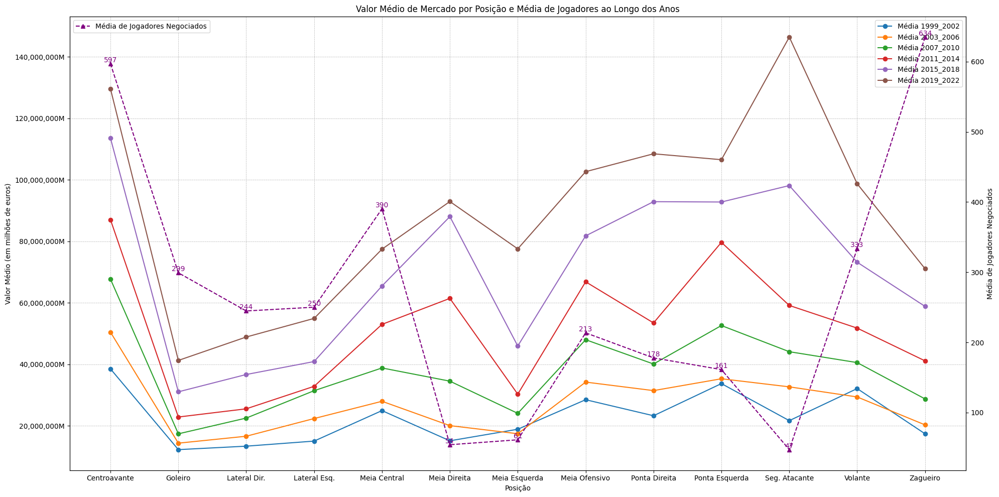

In [8]:
# Periodos analisados
periods = ['1999_2002', '2003_2006', '2007_2010', '2011_2014', '2015_2018', '2019_2022']

# Lista das colunas relacionadas à quantidade de jogadores
qtd_jogadores_columns = [col for col in results.columns if 'Qtd_Jogadores' in col]

# Calcular a média dessas colunas e criar a coluna 'Media_Qtd_Jogadores'
results['Media_Qtd_Jogadores'] = results[qtd_jogadores_columns].mean(axis=1)

# Inicializar a figura e os dois eixos
fig, ax1 = plt.subplots(figsize=(20, 10))

# Plotar as curvas de valor médio no ax1
for period in periods:
    ax1.plot(results['Posicao'], results[f'Media_{period}'], label=f'Média {period}', marker='o')

# Configurações do ax1
ax1.set_title('Valor Médio de Mercado por Posição e Média de Jogadores ao Longo dos Anos')
ax1.set_xlabel('Posição')
ax1.set_ylabel('Valor Médio (em milhões de euros)')
ax1.grid(True, which='both', linestyle='--', linewidth=0.5)
y_formatter = plt.FuncFormatter(lambda x, loc: "{:,}M".format(int(x)))
ax1.yaxis.set_major_formatter(y_formatter)
ax1.legend(loc='upper left')

# Criar o eixo secundário ax2 para a média de jogadores
ax2 = ax1.twinx()
ax2.plot(results['Posicao'], results['Media_Qtd_Jogadores'], label='Média de Jogadores Negociados', linestyle='--', marker='^', color='purple')
for x, y in zip(results["Posicao"], results["Media_Qtd_Jogadores"]):
    ax2.text(x, y, str(int(y)), color='purple', ha='center', va='bottom')
ax2.set_ylabel('Média de Jogadores Negociados')
ax2.legend(loc='upper left')
ax1.legend(loc='upper right')

plt.tight_layout()
plt.show()


O gráfico apresentado visa demonstrar a influência da posição de um jogador em seu valor de transferência ao longo dos anos.

Cada linha do gráfico indica a média dos valores de transferência para um período específico, desconsiderando a inflação. No eixo y, temos o valor de transferência, enquanto no eixo x encontramos a posição do jogador. A linha tracejada roxa ilustra a média de jogadores negociados durante todo o período em análise.

Observa-se uma clara tendência na valorização de determinadas posições em relação a outras. Notadamente, posições ofensivas, como atacantes e pontas, tendem a ter uma valorização superior em comparação com as demais. Embora os zagueiros apresentem a maior média de transferências ao longo do tempo, seu valor de mercado relativo é surpreendentemente mais baixo.

Outro ponto relevante é a consistência da hierarquia de valorização das posições. Não há indicação clara de uma posição ultrapassando outra em termos de valorização, exceto para os pontas-direitas, que começaram a ganhar destaque a partir de 2015-2018 e mantiveram-se em ascensão na janela subsequente.

Curiosidades também surgem, como a variação entre os valores médios de transferência dos meia-esquerdas e dos meia-direitas. Na janela de 1999-2002, os meia-esquerdas levavam vantagem, porém essa tendência se inverteu nas janelas de 2011-2014 e 2015-2018, favorecendo os meia-direitas.

A conclusão primordial é que a posição de um jogador tem um impacto significativo no seu valor de mercado, sendo observado que essa relação tem se mantido ao longo dos anos. A questão que permanece é: essa influência ocorre devido a uma preferência dos clubes ou está atrelada a fatores de desempenho e performance? Esta é uma análise que também vamos abordar mais a frente.

#Variação do Valor Médio de Compra ou Venda dos Jogadores de Acordo com a Idade ao Longo do Tempo:

Neste estudo, focamos nossa atenção na relação entre a idade de um jogador e seu valor de mercado. A idade é frequentemente vista como um indicador de experiência, potencial e longevidade na carreira de um jogador. Mas como esses fatores têm sido traduzidos em termos monetários ao longo dos anos?

Ao analisar os valores médios de compra ou venda, buscamos entender tendências e variações relacionadas à idade dos jogadores. Por exemplo, os jovens sempre foram mais valorizados do que os veteranos experientes? Ou houve períodos em que jogadores em seus picos físicos, geralmente na faixa dos 20 aos 30 anos, dominaram o mercado de transferências em termos de valor?

Além disso, ao levar em consideração diferentes períodos de tempo, é importante notar que este estudo não considera alguns fatores externos, tais como evoluções táticas, avanços na medicina esportiva ou mudanças econômicas, que podem ter influenciado a percepção do valor de um jogador com base em sua idade.

Com esta análise, esperamos elucidar a complexa interação entre idade, valor e tempo no mundo das transferências de futebol dentro das ligas analisadas, oferecendo insights valiosos sobre a economia do esporte e as preferências dos clubes ao longo das décadas.

In [11]:
# Definindo o novo job de acordo com a consulta em questão

job = client.get_job('bquxjob_d669252_18aec21ab9c')
print(job.query)

WITH AggregatedData AS (
    SELECT 
        fdes.Idade,
        CASE 
            WHEN dliga.Ano BETWEEN 1999 AND 2002 THEN '1999-2002'
            WHEN dliga.Ano BETWEEN 2003 AND 2006 THEN '2003-2006'
            WHEN dliga.Ano BETWEEN 2007 AND 2010 THEN '2007-2010'
            WHEN dliga.Ano BETWEEN 2011 AND 2014 THEN '2011-2014'
            WHEN dliga.Ano BETWEEN 2015 AND 2018 THEN '2015-2018'
            WHEN dliga.Ano BETWEEN 2019 AND 2022 THEN '2019-2022'
            ELSE '2023'
        END AS Periodo,
        AVG(ftrans.Quantia_Paga_ou_Recebida) AS Media_Quantia_Paga_ou_Recebida,
        COUNT(DISTINCT fdes.ID_Jogador) as Qtd_Jogadores
    FROM 
        pbrandao_mvp_futebol.fato_desempenho fdes
    JOIN
        pbrandao_mvp_futebol.fato_transferencia ftrans
    ON 
        fdes.ID_Jogador = ftrans.ID_Jogador
    JOIN
        pbrandao_mvp_futebol.dim_liga_ano dliga
    ON 
        fdes.ID_LigaAno = dliga.ID_LigaAno
    WHERE 
        fdes.Idade IS NOT NULL AND ftrans.Quantia_Pag

In [12]:
# Aramazenando o novo resultado da consulta em um dataframe chamado "results"

results = job.to_dataframe()
results

,Idade,Media_1999_2002,Media_2003_2006,Media_2007_2010,Media_2011_2014,Media_2015_2018,Media_2019_2022,Qtd_Jogadores_1999_2002,Qtd_Jogadores_2003_2006,Qtd_Jogadores_2007_2010,Qtd_Jogadores_2011_2014,Qtd_Jogadores_2015_2018,Qtd_Jogadores_2019_2022
0,14,NaN,NaN,NaN,NaN,NaN,6.666667e+04,<NA>,<NA>,<NA>,<NA>,<NA>,1
1,15,2.982143e+06,1.350000e+06,5.785185e+06,7.522500e+06,9.765889e+06,NaN,4,1,4,4,6,<NA>
2,16,5.517984e+06,3.434159e+06,8.728898e+06,8.226645e+06,1.513125e+07,1.016080e+07,14,25,24,36,20,14
3,17,4.439369e+06,4.747075e+06,6.869319e+06,8.380857e+06,1.520162e+07,9.936917e+06,80,105,125,102,92,67
4,18,4.009003e+06,4.837045e+06,5.516609e+06,8.412030e+06,1.250900e+07,1.067812e+07,160,246,260,264,219,156
5,19,3.466722e+06,3.847280e+06,5.118917e+06,7.356719e+06,1.035520e+07,1.284581e+07,297,390,369,370,366,265
6,20,3.364013e+06,3.605688e+06,4.465338e+06,7.625424e+06,8.694033e+06,1.300244e+07,388,474,487,453,498,366
7,21,3.053029e+06,3.625836e+06,4.390150e+06,6.585832e+06,8.358799e+06,1.249221e+07,472,488,548,568,562,471
8,22,3.118089e+06,3.420798e+06,4.153822e+06,5.646084e+06,7.943818e+06,1.154337e+07,493,554,642,616,596,620
9,23,2.845247e+06,3.064478e+06,4.020773e+06,5.173550e+06,7.782293e+06,1.037202e+07,510,629,682,668,674,666


#Gráficos e análises

Primeiro, importamos as bibliotecas relevantes para realizar a análise dos dados e plotamos os gráficos. A seguir realizamos as conclusões acerca do resultado exibido.

In [13]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

df = results

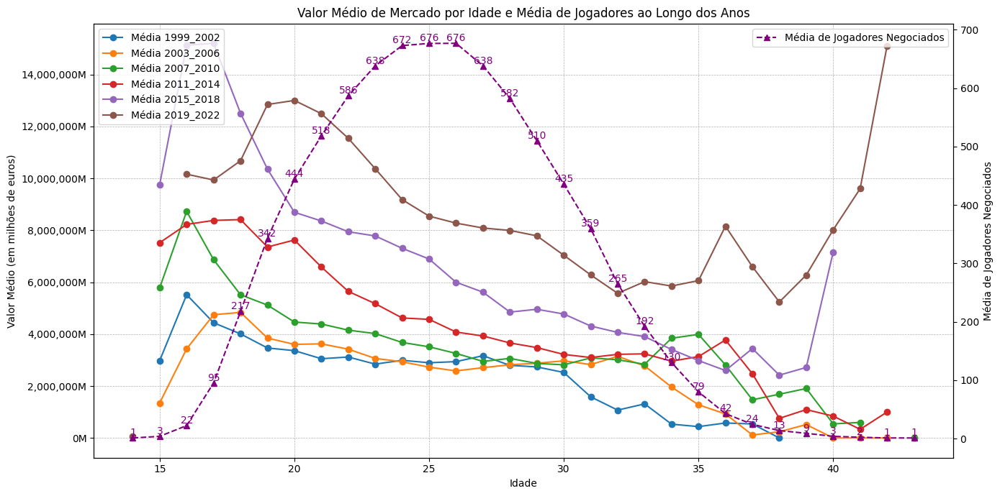

In [14]:
# Períodos analisados
periods = ['1999_2002', '2003_2006', '2007_2010', '2011_2014', '2015_2018', '2019_2022']

# Calcular a média da quantidade de jogadores por idade
results['Media_Qtd_Jogadores'] = results[['Qtd_Jogadores_1999_2002', 'Qtd_Jogadores_2003_2006', 'Qtd_Jogadores_2007_2010', 'Qtd_Jogadores_2011_2014', 'Qtd_Jogadores_2015_2018', 'Qtd_Jogadores_2019_2022']].mean(axis=1)

# Inicializar a figura e os dois eixos
fig, ax1 = plt.subplots(figsize=(14, 7))

# Plotar as curvas de valor médio no ax1
for period in periods:
    ax1.plot(results['Idade'], results[f'Media_{period}'], label=f'Média {period}', marker='o')

# Configurações do ax1
ax1.set_title('Valor Médio de Mercado por Idade e Média de Jogadores ao Longo dos Anos')
ax1.set_xlabel('Idade')
ax1.set_ylabel('Valor Médio (em milhões de euros)')
ax1.grid(True, which='both', linestyle='--', linewidth=0.5)
y_formatter = plt.FuncFormatter(lambda x, loc: "{:,}M".format(int(x)))
ax1.yaxis.set_major_formatter(y_formatter)
ax1.legend(loc='upper left')

# Criar o eixo secundário ax2 para a média de jogadores
ax2 = ax1.twinx()
ax2.plot(results['Idade'], results['Media_Qtd_Jogadores'], label='Média de Jogadores Negociados', linestyle='--', marker='^', color='purple')
for x, y in zip(results["Idade"], results["Media_Qtd_Jogadores"]):
    ax2.text(x, y, str(int(y)), color='purple', ha='center', va='bottom')
ax2.set_ylabel('Média de Jogadores Negociados')
ax2.legend(loc='upper right')

plt.tight_layout()
plt.show()

Primeiramente, ao analisarmos a linha roxa, observamos que a quantidade média de jogadores negociados distribuídos por idade segue uma distribuição normal, com um pico entre os 24 e 26 anos. Esta distribuição é esperada, considerando a trajetória típica de um jogador de futebol. A carreira geralmente começa com a transição da base para o profissional, quando os atletas ainda são muito jovens, culminando na aposentadoria. Embora a idade de aposentadoria possa variar ao longo dos anos, é comum que ocorra por volta dos 35 anos de idade nos dias de hoje.

Em relação ao valor de mercado, nota-se um declínio evidente para janelas temporais mais recentes à medida em que os jogadores atingem idades mais avançadas. Nas faixas etárias onde temos uma quantidade maior de dados disponíveis, percebe-se que os 20 anos representam um pico nos valores médios de transferências. A partir desta idade, há uma tendência de redução nos valores. Contudo, nas janelas temporais de 1999-2002 e 2003-2006, a relação era mais linear. Isso, porque os valores médios de transferência dos jogadores mantinham-se consistentes, independentemente da idade, apresentando quedas apenas quando se aproximavam da idade típica de aposentadoria.

Há casos isolados de jogadores com 15 e 16 anos que apresentam uma valorização excepcional no mercado. A escassez destes casos se deve ao fato de serem vistos pelos clubes como "joias" - jovens talentos em que as equipes depositam grandes expectativas. Ao investir significativamente nesses promissores atletas, os clubes elevam a média do valor de mercado, especialmente porque são poucos os jogadores nessa faixa etária e a maioria deles é supervalorizada.

Por outro lado, também existem casos de jogadores mais velhos que elevam a média dos valores de transferência. Esse fenômeno é influenciado, em parte, pela escassez de registros nessa faixa etária. Estes jogadores representam o contraponto aos mais jovens: são investimentos de clubes que, embora reconheçam a idade avançada do atleta, valorizam sua vasta experiência e renome, buscando aproveitar sua bagagem para contribuir com a equipe.

Em suma, a idade desempenha, de fato, um papel crucial na determinação do valor de transferência de um jogador. Enquanto jovens talentos, por volta dos 15 e 16 anos, são frequentemente supervalorizados devido às grandes expectativas depositadas neles, jogadores com cerca de 20 anos, apesar de ainda serem jovens, representam um equilíbrio: já estão em fase de consolidação de carreira e não são mais vistos apenas como "promessas", possuindo uma combinação de juventude e potencial de alto rendimento. Por outro lado, atletas mais experientes, mesmo com idade avançada, podem comandar valores de transferência elevados, graças ao seu renome e à experiência valiosa que trazem para os clubes.

#Valorização e Poder Aquisitivo das Ligas de Futebol ao Longo do Tempo:

Ao analisar as ligas de futebol ao longo dos anos, é crucial compreender como o poder aquisitivo dessas ligas tem evoluído, especialmente em relação à aquisição de jogadores, já que essa métrica distingue o poder de compra dessas ligas em relação às outras. Esse estudo visa elucidar as tendências de investimento e como as 5 principais ligas europeias têm ampliado ou restringido seus orçamentos em transferências.

Neste contexto, consideramos tanto o poder de compra absoluto como o médio. O primeiro refere-se ao valor total de investimento que as ligas têm desembolsado a cada ano, enquanto o segundo alude ao valor médio de transferências em cada período.

Espera-se que esta análise revele insights sobre:

*   Ligas que têm consistentemente aumentado seus investimentos em jogadores, sinalizando uma estratégia de crescimento ou uma resposta a uma crescente competitividade.
*   Ligas que, por outro lado, têm restringido ou mantido seus gastos, possivelmente devido a limitações financeiras ou uma abordagem mais conservadora na gestão.
*   Tendências gerais no mercado de transferências, como períodos de inflação ou deflação nos valores dos jogadores, influenciados por eventos globais, como crises econômicas ou mudanças nas regulamentações do futebol.

Ao entender estas dinâmicas, podemos ter uma visão mais clara sobre a saúde financeira e as estratégias das ligas, bem como as implicações para o mercado global de jogadores de futebol.



In [15]:
# Definindo o novo job de acordo com a consulta em questão

job = client.get_job('bquxjob_2ce8eb4b_18aec22774b')
print(job.query)

WITH MarketData AS (
    SELECT
        dliga.Liga,
        dliga.Ano,
        SUM(ftrans.Quantia_Paga_ou_Recebida) AS Valor_Total_Gasto,
        COUNT(DISTINCT ftrans.ID_Jogador) AS Qtd_Jogadores_Comprados
    FROM
        pbrandao_mvp_futebol.fato_transferencia ftrans
    JOIN
        pbrandao_mvp_futebol.dim_liga_ano dliga
    ON
        ftrans.ID_LigaAno = dliga.ID_LigaAno
    WHERE
        ftrans.Quantia_Paga_ou_Recebida IS NOT NULL AND ftrans.Tipo_de_Transferencia = 'Entrada'
    GROUP BY
        dliga.Liga, dliga.Ano
    HAVING
        Qtd_Jogadores_Comprados > 0
)

SELECT 
    Liga,
    Ano,
    Valor_Total_Gasto,
    Valor_Total_Gasto / Qtd_Jogadores_Comprados AS Valor_Medio_Gasto,
    Qtd_Jogadores_Comprados
FROM
    MarketData
ORDER BY
    Liga, Ano;



In [16]:
# Aramazenando o novo resultado da consulta em um dataframe chamado "results"

results = job.to_dataframe()
results

,Liga,Ano,Valor_Total_Gasto,Valor_Medio_Gasto,Qtd_Jogadores_Comprados
0,Bundesliga,2000,1.101450e+08,9.495259e+05,116
1,Bundesliga,2004,8.650000e+07,6.811024e+05,127
2,Bundesliga,2005,9.746000e+07,7.555039e+05,129
3,Bundesliga,2006,1.394050e+08,1.222851e+06,114
4,Bundesliga,2007,2.496600e+08,1.653377e+06,151
...,...,...,...,...,...
112,Serie-A,2019,1.355203e+09,6.844460e+06,198
113,Serie-A,2020,9.185620e+08,5.777119e+06,159
114,Serie-A,2021,7.813130e+08,4.516260e+06,173
115,Serie-A,2022,7.707850e+08,4.258481e+06,181


#Gráficos e análises
Primeiro, importamos as bibliotecas relevantes para realizar a análise dos dados e plotamos os gráficos. A seguir realizamos as conclusões acerca do resultado exibido.

In [17]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

df = results

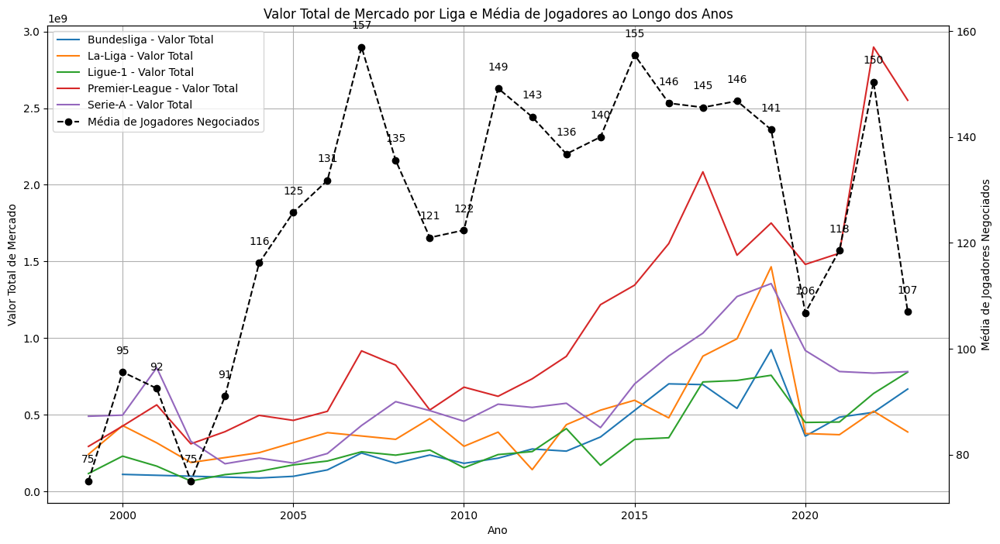

In [18]:
# Calcular a média da contagem de jogadores para cada ano
media_jogadores_por_ano = df.groupby('Ano')['Qtd_Jogadores_Comprados'].mean()

# Preparar o gráfico
plt.figure(figsize=(15, 8))
ax1 = plt.gca()  # Primeiro eixo (Valor Total de Mercado)
ax2 = ax1.twinx()  # Segundo eixo (Quantidade de Jogadores)

# Plotar Valor Total de Mercado
lines = []  # Lista para armazenar as linhas para a legenda
labels = []  # Lista para armazenar os rótulos para a legenda

for liga in df['Liga'].unique():
    subset_liga = df[df['Liga'] == liga]
    line, = ax1.plot(subset_liga['Ano'], subset_liga['Valor_Total_Gasto'], label=f"{liga} - Valor Total")
    lines.append(line)
    labels.append(f"{liga} - Valor Total")

# Plotar a média da quantidade de jogadores (eixo secundário)
line, = ax2.plot(media_jogadores_por_ano.index, media_jogadores_por_ano, 'o--', color="black", label="Média de Jogadores Negociados")
lines.append(line)
labels.append("Média de Jogadores Negociados")

# Adicionar os valores de quantidade na linha
for i, v in enumerate(media_jogadores_por_ano):
    ax2.text(media_jogadores_por_ano.index[i], v + 3, int(v), ha='center', va='bottom', color='black')

# Configurações e legendas
ax1.set_title("Valor Total de Mercado por Liga e Média de Jogadores ao Longo dos Anos")
ax1.set_xlabel("Ano")
ax1.set_ylabel("Valor Total de Mercado")
ax2.set_ylabel("Média de Jogadores Negociados")
ax1.legend(lines, labels, loc="upper left")
ax1.grid(True)

plt.show()


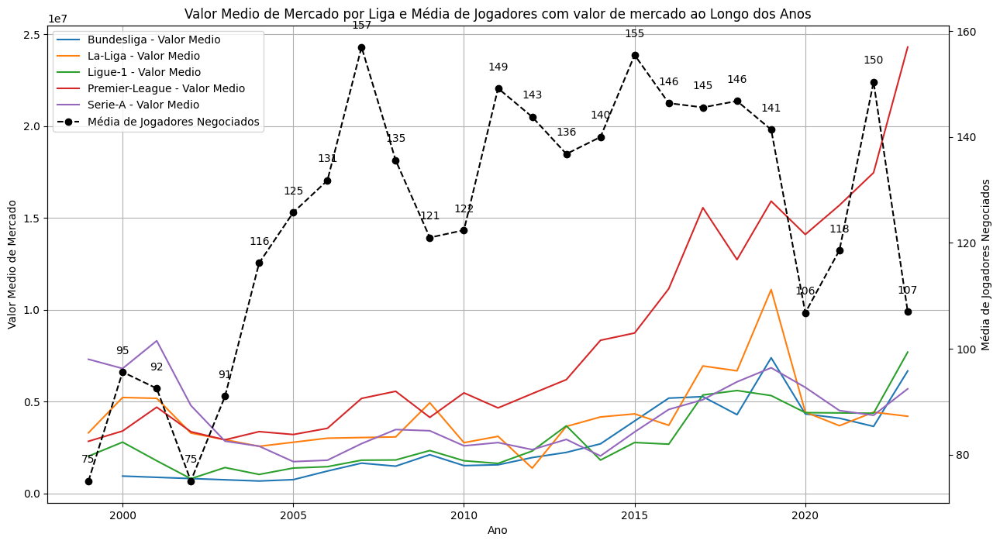

In [19]:
# Calcular a média da contagem de jogadores para cada ano
media_jogadores_por_ano = df.groupby('Ano')['Qtd_Jogadores_Comprados'].mean()

# Preparar o gráfico
plt.figure(figsize=(15, 8))
ax1 = plt.gca()  # Primeiro eixo (Valor Medio de Mercado)
ax2 = ax1.twinx()  # Segundo eixo (Quantidade de Jogadores)

# Plotar Valor Médio de Mercado
lines = []  # Lista para armazenar as linhas para a legenda
labels = []  # Lista para armazenar os rótulos para a legenda

for liga in df['Liga'].unique():
    subset_liga = df[df['Liga'] == liga]
    line, = ax1.plot(subset_liga['Ano'], subset_liga['Valor_Medio_Gasto'], label=f"{liga} - Valor Medio")
    lines.append(line)
    labels.append(f"{liga} - Valor Medio")

# Plotar a média da quantidade de jogadores (eixo secundário)
line, = ax2.plot(media_jogadores_por_ano.index, media_jogadores_por_ano, 'o--', color="black", label="Média de Jogadores Negociados")
lines.append(line)
labels.append("Média de Jogadores Negociados")

# Adicionar os valores de quantidade na linha
for i, v in enumerate(media_jogadores_por_ano):
    ax2.text(media_jogadores_por_ano.index[i], v + 3, int(v), ha='center', va='bottom', color='black')

# Configurações e legendas
ax1.set_title("Valor Medio de Mercado por Liga e Média de Jogadores com valor de mercado ao Longo dos Anos")
ax1.set_xlabel("Ano")
ax1.set_ylabel("Valor Medio de Mercado")
ax2.set_ylabel("Média de Jogadores Negociados")
ax1.legend(lines, labels, loc="upper left")
ax1.grid(True)

plt.show()

Nos gráficos apresentados, a linha preta denota a média de transferências realizadas em um determinado ano, levando em conta todas as cinco ligas analisadas. Chama a atenção o padrão observado em anos posteriores às Copas do Mundo: frequentemente, há um aumento na média de transferências no ano subsequente ao torneio. No entanto, a Copa do Mundo de 2022 no Catar quebrou essa tendência, com 2023 mostrando uma queda acentuada. Uma possível explicação para essa anomalia pode ser a realização da Copa no final do ano, em contraste com o tradicional período de meio do ano.

A transição de 2019 para 2020 destaca-se de forma marcante. É evidente que a quantidade e os valores, tanto médios quanto absolutos, das transferências sofreram um impacto significativo devido à pandemia da COVID-19. Esse resultado é compreensível, considerando que os clubes enfrentaram períodos sem jogos e, consequentemente, tiveram seu potencial de geração de receita drasticamente reduzido. Isso levou a uma retração nos gastos com transferências, diminuindo não apenas o número, mas também os montantes envolvidos nas negociações.


De maneira geral, 2015 também parece ter sido um ano de tendência de alta para os mercados europeus, que se mantiveram seu poder aquisitivo em ascensão até a pandemia de 2019.


#Premier League
A Premier League (liga inglesa) destaca-se não apenas pelos seus valores absolutos, mas também pelos médios, solidificando sua supremacia no cenário do futebol mundial. Esta liga é renomada pela competitividade entre suas equipes, sendo frequentemente apontada como a mais equilibrada da Europa. Sua ampla atratividade global faz dela um imã para telespectadores de todo o mundo, catalisando ainda mais o investimento.

Um dos principais propulsores financeiros tem sido os direitos de transmissão televisiva, que experimentaram um crescimento exponencial desde a década de 1990. Ademais, a partir dos anos 2000, a liga testemunhou uma série de aquisições de clubes por magnatas estrangeiros, com Chelsea (Roman Abramovich), Manchester City (Sheikh Mansour) e Manchester United (Família Glazer) como exemplos emblemáticos.

Além de ostentar a posição de liga mais rica do mundo, a Premier League também se destaca pelo impressionante crescimento pós-pandemia, conforme evidenciado nos gráficos.

#La Liga
Em contraste à liga inglesa, notamos hoje a La Liga (liga espanhola) como a última em poder aquisitivo, tanto em valores médios, quanto absolutos. A La Liga tem sido historicamente dominada por dois gigantes: Real Madrid e FC Barcelona. Estes clubes têm gerado receitas significativamente mais altas do que seus rivais devido a acordos de patrocínio lucrativos, vendas de camisas e receitas de bilheteria. A distribuição dos direitos de TV na Espanha historicamente também favoreceu esses dois clubes, embora tenha havido esforços recentes para distribuir as receitas de forma mais equitativa entre todos os clubes da La Liga, assim como é realizado na liga inglesa.

Sendo assim, muitos clubes da La Liga têm enfrentado problemas de endividamento e, apesar das receitas elevadas, clubes como Real Madrid e Barcelona também têm acumulado dívidas substanciais. Clubes menores, sem o mesmo poder aquisitivo, enfrentam ainda maiores desafios financeiros e são mais vulneráveis às flutuações econômicas.


#Bundesliga
À primeira vista, olhando ambos os gráficos, a Bundesliga pode parecer financeiramente conservadora devido ao volume relativamente baixo de transferências. No entanto, essa percepção é enganosa. A liga alemã, de fato, possui uma robustez financeira e uma estratégia distinta que prioriza a formação de atletas. Essa liga é renomada por cultivar e promover talentos locais, optando por investir significativamente em suas categorias de base, em vez de gastar grandes quantidades em transferências internacionais.

A abordagem financeira da Bundesliga é marcada por prudência e equilíbrio. Os clubes da liga são amplamente elogiados por sua gestão sábia, operando dentro de seus meios e evitando acumular dívidas excessivas. A emblemática regra "50+1" é central nesse modelo financeiro, assegurando que os clubes sejam predominantemente de propriedade de seus membros. Essa normativa não só garante estabilidade financeira, mas também protege os clubes de aquisições potencialmente desestabilizadoras.

O foco incisivo da Bundesliga no desenvolvimento interno transcende os benefícios econômicos, evitando gastos astronômicos com transferências. Ao priorizar e valorizar os jovens talentos, a liga não só reforça os elencos dos clubes, mas também contribui significativamente para o sucesso da tetra campeã mundial seleção alemã.

Entretanto, a liga ainda sim possui saúde financeira para contratar jogadores caso seja necessário. Observando os gráficos, podemos ver que, após a Copa do Mundo de 2010, ano que a seleção alemã foi terceira colocada, houve um aumento no investimento em aquisição de jogadores por parte da liga em comparação aos outros anos.

#Serie A

A Serie A, que já foi considerada a liga de futebol mais prestigiosa do mundo nos anos 80 e 90, enfrentou desafios financeiros significativos nas décadas de 2000 e 2010. Estes desafios foram exacerbados por escândalos, como o famoso "Calciopoli" em 2006, que prejudicou a imagem da liga e resultou em rebaixamentos e penalizações para alguns dos maiores clubes do país. No entanto, ao analisarmos o gráfico, não é possível estabelecer uma correlação direta entre os eventos de 2006 e um declínio no poder aquisitivo da Serie A. De fato, no início de nossa análise, a liga italiana ocupava a posição de destaque em termos de poder aquisitivo. Porém, com o passar do tempo, sua força financeira foi se dissipando até que, coincidentemente, estagnou por volta de 2006.

# Ligue 1

Embora frequentemente rotulada como a "liga mais fraca" dentre as cinco principais ligas europeias, a Ligue 1 apresenta uma dinâmica única.

A aquisição do Paris Saint-Germain (PSG) por investidores do Catar em 2011 marcou um ponto de inflexão para a liga. Esse aporte financeiro catapultou o PSG a um patamar de elite, não só dentro das fronteiras francesas, mas também na cena europeia. No entanto, essa ascensão também gerou uma disparidade significativa, com o PSG muitas vezes eclipsando seus rivais domésticos em termos de gastos e sucesso.

Fora da sombra do PSG, muitos clubes da Ligue 1 enfrentam desafios financeiros e lutam para manter sua relevância no cenário europeu. No entanto, a França, como nação, ostenta uma reputação invejável por sua produção contínua de talentos de classe mundial. As academias de formação dos clubes da Ligue 1 são berços de jovens talentos que frequentemente brilham tanto na liga quanto em palcos internacionais. Contudo, a Ligue 1 enfrenta o desafio constante de reter esses talentos, muitos dos quais são atraídos pelas outras ligas europeias de maior prestígio.





#Relação entre o Valor de Transferência e Performance dos Jogadores nas Cinco Principais Ligas Europeias:

Neste estudo, voltamos nossa atenção para a relação entre o desempenho de um jogador em campo e seu consequente valor de transferência. Tradicionalmente, espera-se que jogadores com estatísticas impressionantes em campo comandem valores de transferência mais elevados, mas até que ponto essa premissa se mantém verdadeira diante das infinidades de fatores que podem influênciar o valor de uma transferência?

Ao examinar métricas de performance como gols marcados, assistências e número de partidas jogadas, buscamos compreender a interconexão entre a habilidade demonstrada em campo e o valor monetário que os clubes estão dispostos a pagar. Será que um aumento no número de gols de um atacante ou a consistência de um meio-campista em fornecer assistências tem uma correlação direta com seus valores de transferência?

A complexidade dessa análise é aprofundada ao considerarmos diferentes ligas e períodos de tempo. Cada liga possui sua própria cultura e valorização de diferentes posições e estilos de jogo. Além disso, o futebol, como qualquer outro esporte, evolui, de modo que o que era valorizado em 1999 pode não ser tão crucial em 2022.

Ao fim desta análise, nosso objetivo é desvendar os padrões subjacentes que ditam como a performance em campo é traduzida em valor monetário no mercado de transferências. Esperamos tentar explicar algumas nuances da economia do futebol e oferecer insights sobre as tendências e preferências que têm moldado o cenário das transferências nas principais ligas europeias ao longo dos anos.

In [20]:
# Definindo o novo job de acordo com a consulta em questão

job = client.get_job('bquxjob_60c5ec0_18aec232e6a')
print(job.query)

WITH PerformanceAggregated AS (
    SELECT 
        fdes.ID_Jogador,
        ftrans.ID_Time_Ref AS Time_Desempenho,
        ftrans.ID_LigaAno,
        AVG(fdes.Partidas) AS Media_Partidas,
        AVG(fdes.Gols) AS Media_Gols,
        AVG(fdes.Assistencias) AS Media_Assistencias,
        AVG(fdes.Minutos_jogados) AS Media_Minutos_Jogados,
        AVG(fdes.Gols_por_Jogo) AS Media_Gols_por_Jogo,
        AVG(fdes.Min_para_participar) AS Media_Min_para_participar,
        AVG(fdes.cartoes_amarelos) AS Media_amarelos,
        AVG(fdes.Cartoes_vermelhos) AS Media_vermelhos,
        AVG(fdes.Progressao_jogadas) AS Media_Progressao_jogadas,
        AVG(fdes.Progressao_passes) AS Media_Progressao_passes,
        AVG(fdes.Desarmes_de_progressao) AS Media_Desarmes_de_progressao
    FROM 
        pbrandao_mvp_futebol.fato_desempenho fdes
    JOIN
        pbrandao_mvp_futebol.fato_transferencia ftrans
    ON 
        fdes.ID_Jogador = ftrans.ID_Jogador
        AND fdes.ID_Time = ftrans.ID_Time_Ref


In [21]:
# Armazenando o novo resultado da consulta em um dataframe chamado "results"

results = job.to_dataframe()
results

,Posicao_Reclassificada,ID_Jogador,Jogador,Posicao,Time_Origem,Liga_Origem,Ano_Transferencia,Valor_Transferencia,Media_Partidas,Media_Gols,Media_Assistencias,Media_Minutos_Jogados,Media_Gols_por_Jogo,Media_Min_para_participar,Media_amarelos,Media_vermelhos,Media_Progressao_jogadas,Media_Progressao_passes,Media_Desarmes_de_progressao
0,Meio,4,niclas alexandersson,Meia Direita,everton,Premier-League,2004,0.0,19.333333,1.333333,1.666667,1341.0,0.054839,281.055556,1.0,0.0,NaN,NaN,NaN
1,Meio,36,darren anderton,Meia Direita,tottenham,Premier-League,2004,0.0,24.000000,1.800000,4.600000,1963.0,0.071807,308.780000,4.0,0.2,NaN,NaN,NaN
2,Meio,36,darren anderton,Meia Direita,birmingham city,Premier-League,2005,0.0,20.000000,3.000000,1.000000,868.0,0.150000,217.000000,1.0,0.0,NaN,NaN,NaN
3,Ataque,54,tore andre flo,Centroavante,chelsea,Premier-League,2000,18000000.0,24.000000,6.500000,2.000000,1305.5,0.254202,145.462121,1.0,0.0,NaN,NaN,NaN
4,Ataque,54,tore andre flo,Centroavante,siena,Serie-A,2005,0.0,31.000000,6.500000,2.000000,2166.5,0.207419,259.833333,1.5,0.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12607,Ataque,423572,rafael ratao,Ponta Esquerda,toulouse,Ligue-1,2023,2500000.0,30.000000,5.000000,4.000000,1851.0,0.166667,205.666667,2.0,0.0,61.0,83.0,216.0
12608,Ataque,423592,amin sarr,Centroavante,lyon,Ligue-1,2023,1000000.0,8.000000,0.500000,0.500000,317.5,0.038462,134.250000,0.0,0.0,7.5,5.0,27.5
12609,Meio,423627,stijn spierings,Volante,toulouse,Ligue-1,2023,0.0,18.500000,1.000000,0.000000,1576.0,0.027778,780.000000,3.0,0.0,15.5,118.0,15.0
12610,Defesa,423647,thibault tamas,Lateral Esq.,montpellier,Ligue-1,2023,0.0,1.000000,0.000000,0.000000,10.0,0.000000,0.000000,0.0,0.0,0.0,0.0,1.0


#Gráficos e análises

Primeiro, importamos as bibliotecas relevantes para realizar a análise dos dados e plotamos os gráficos. A seguir realizamos as conclusões acerca do resultado exibido.

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import statsmodels.api as sm
import numpy as np

df = results

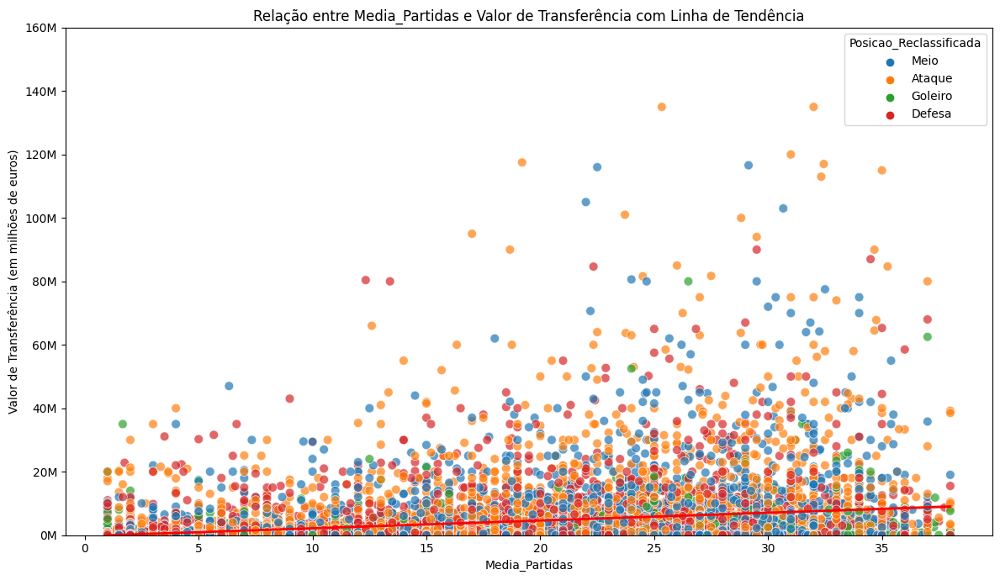

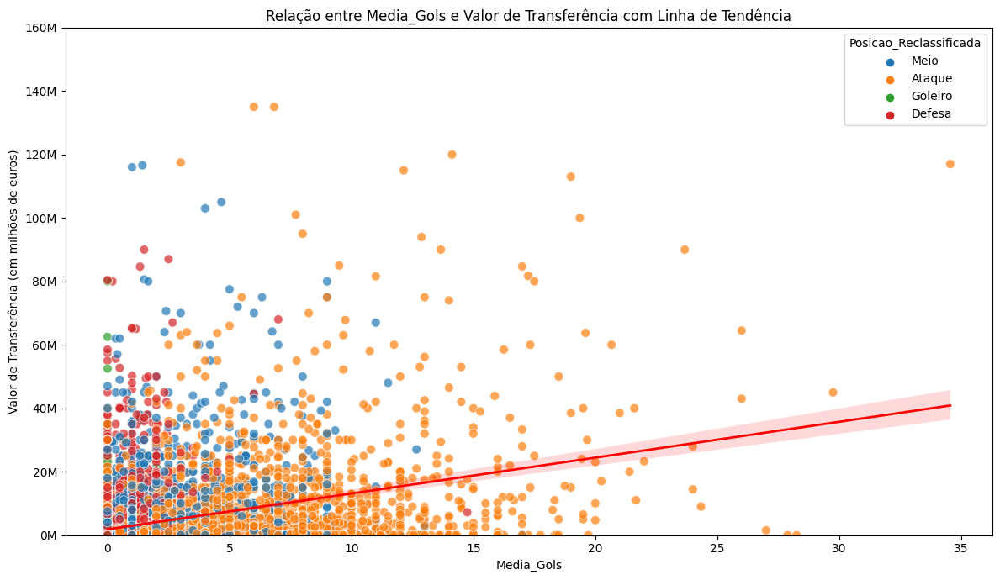

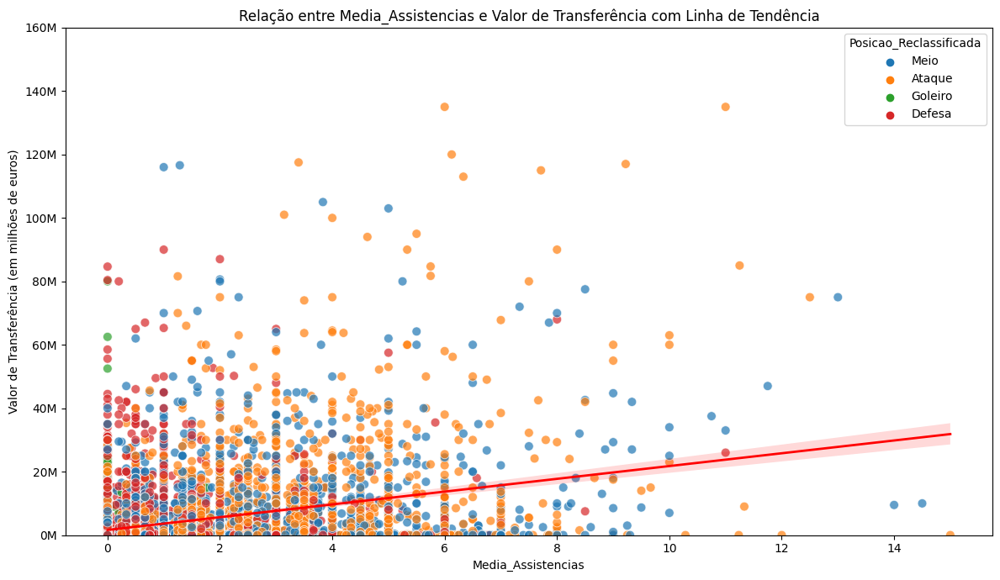

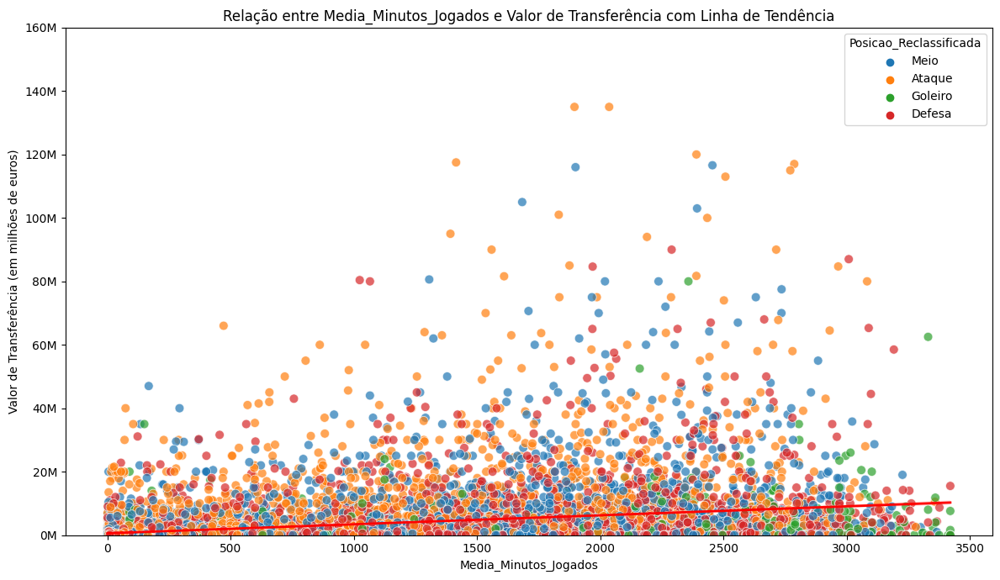

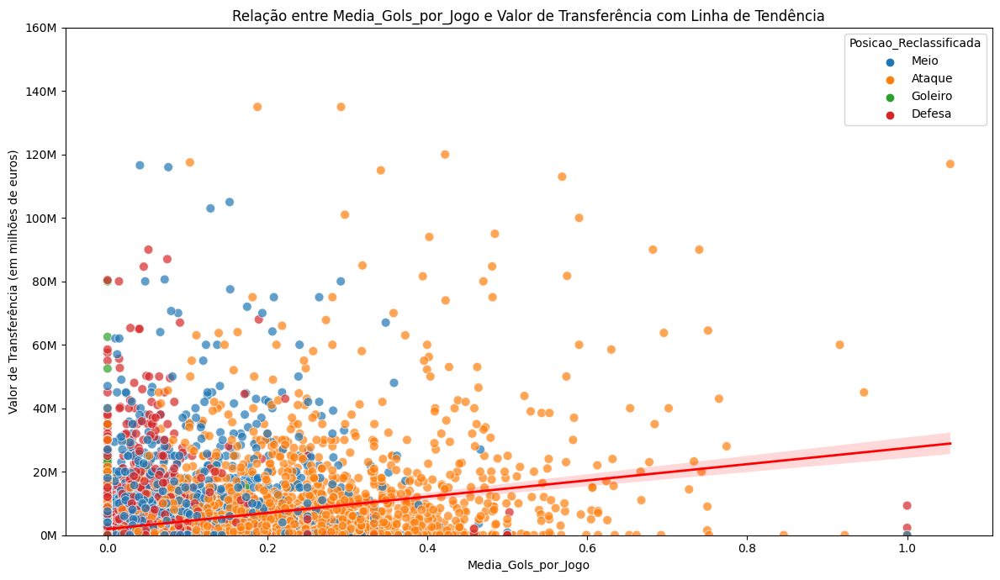

...

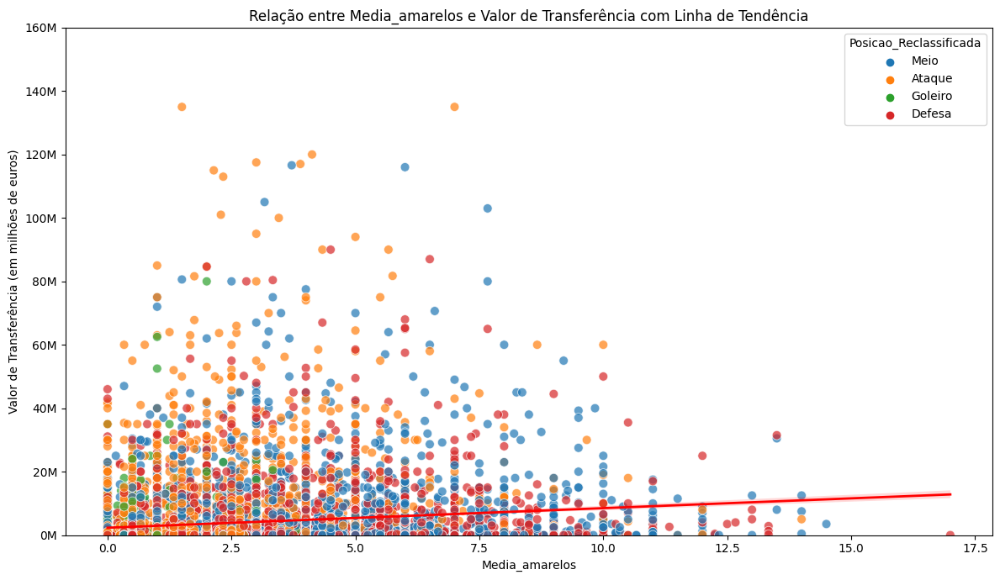

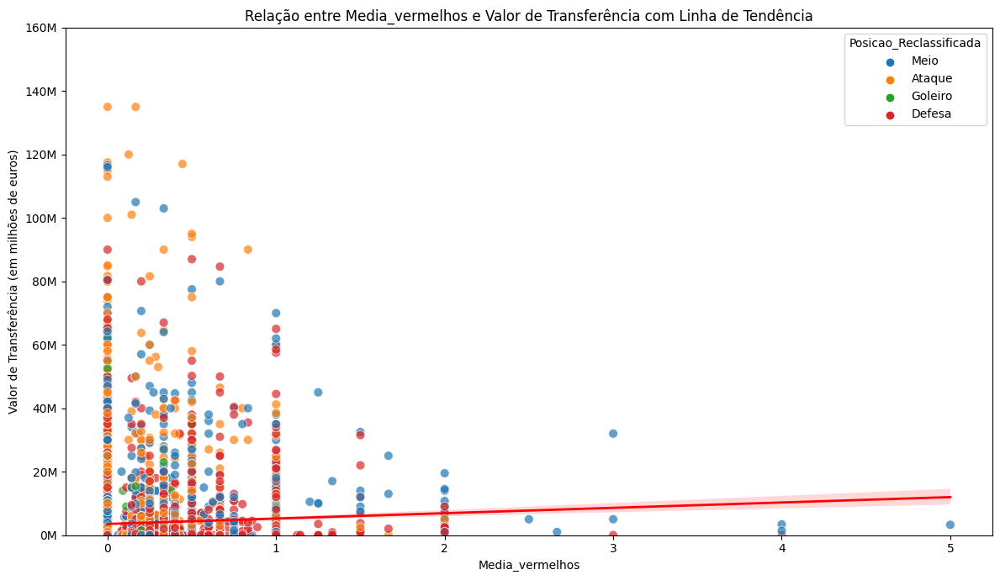

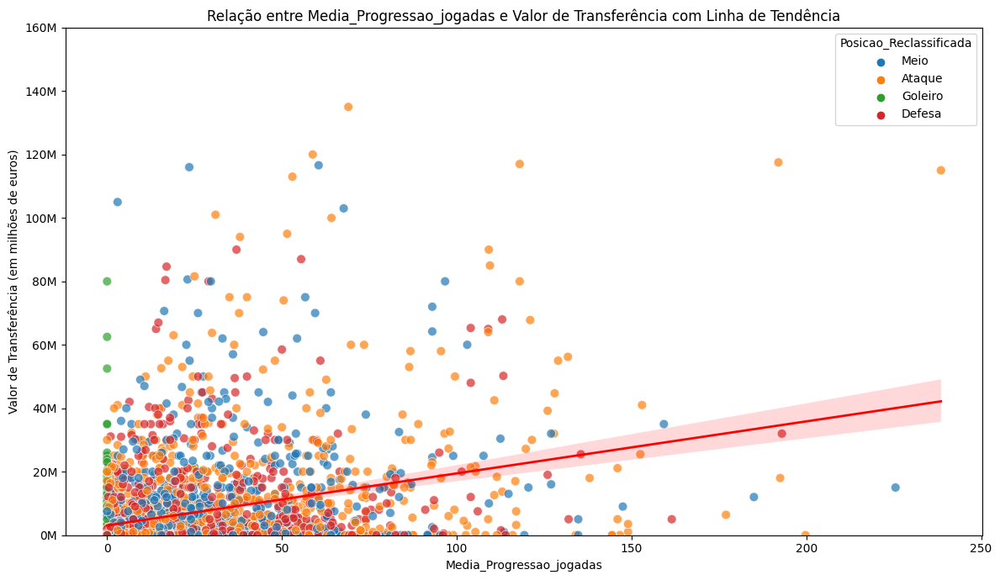

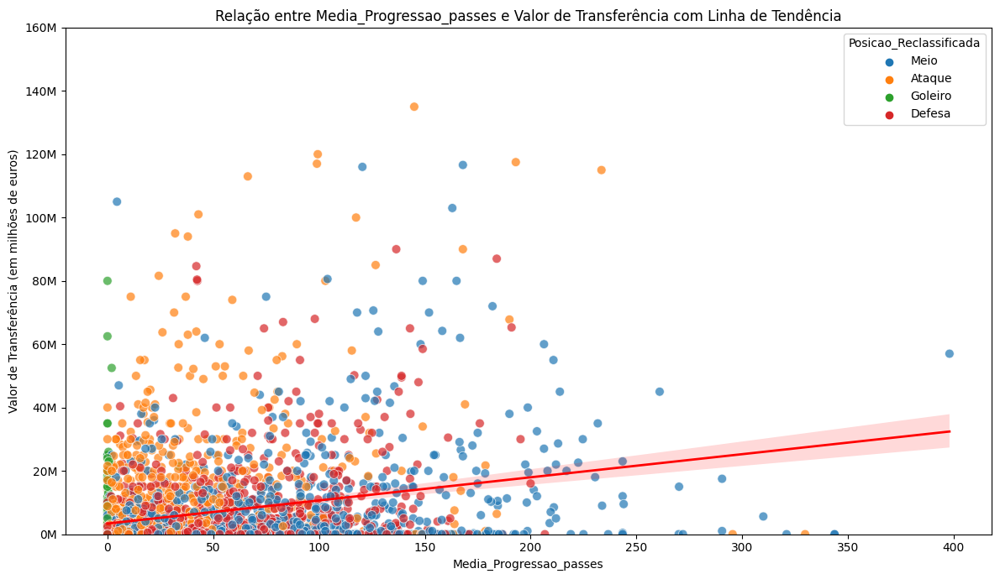

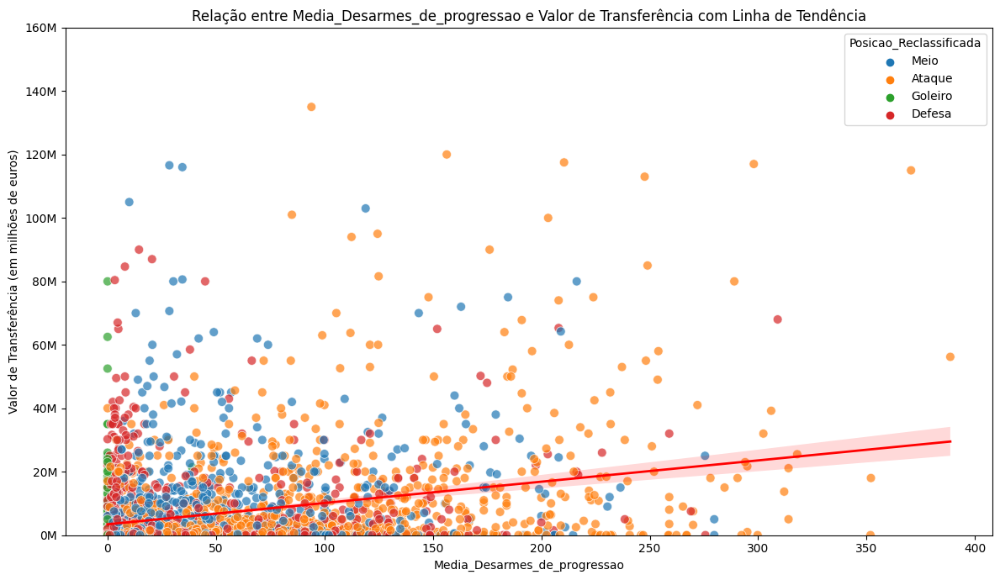

In [23]:
# Lista das métricas de desempenho
metricas = [
    'Media_Partidas',
    'Media_Gols',
    'Media_Assistencias',
    'Media_Minutos_Jogados',
    'Media_Gols_por_Jogo',
    'Media_Min_para_participar',
    'Media_amarelos',
    'Media_vermelhos',
    'Media_Progressao_jogadas',
    'Media_Progressao_passes',
    'Media_Desarmes_de_progressao'
]

  # Para cada métrica, vamos gerar um scatter plot
for metrica in metricas:
    plt.figure(figsize=(12, 7))
    sns.scatterplot(data=df, x=metrica, y='Valor_Transferencia', hue='Posicao_Reclassificada', palette="tab10", s=60, alpha=0.7)

    # Linha de tendência
    sns.regplot(data=df, x=metrica, y='Valor_Transferencia', scatter=False, color='red', line_kws={'linewidth':2})

    plt.title(f'Relação entre {metrica} e Valor de Transferência com Linha de Tendência')
    plt.ylabel('Valor de Transferência (em milhões de euros)')
    plt.xlabel(metrica)

    # Definindo o limite para o eixo y
    plt.ylim(0, 150000000)

    # Formatação do eixo y para melhor visualização
    y_labels = [f'{int(value/1_000_000)}M' for value in plt.yticks()[0]]
    plt.yticks(plt.yticks()[0], y_labels)

    plt.tight_layout()
    plt.show()

Neste segmento da análise, exploramos a inter-relação entre diversas métricas de desempenho dos jogadores e seus valores de transferência. Utilizamos gráficos de dispersão para visualizar cada métrica, colorindo os pontos de acordo com a posição reclassificada do jogador. Esta coloração permite identificar rapidamente tendências ou especificidades para diferentes posições em campo.

Adicionalmente, uma linha de tendência foi incorporada a cada visualização, fornecendo um guia claro sobre a relação predominante entre a métrica de desempenho e o valor de transferência. Essa linha se revela fundamental para discernir a direção e magnitude da relação entre as variáveis.

Ao examinar os gráficos, pode-se perceber a complexidade das transferências de futebol. Enquanto certas métricas de desempenho, como gols ou assistências, podem ter uma influência óbvia sobre o valor de um jogador, outras, como o número de cartões amarelos ou vermelhos, oferecem uma visão mais sutil da relação entre comportamento em campo e valorização de mercado.

Notadamente, há uma clara concentração de jogadores ofensivos com altas contagens de gols. Conforme discutido anteriormente, jogadores de ataque geralmente alcançam valores de transferência mais elevados, sugerindo uma valorização associada à capacidade de marcar gols. As assistências, embora distribuídas entre atacantes e meio-campistas, também parecem influenciar positivamente o valor do jogador. Em contraste, métricas como médias de partidas e minutos jogados não mostram uma correlação tão evidente com o valor de transferência, embora haja uma notável presença de goleiros com muitos minutos jogados.

A métrica de gols por jogo, que representa a eficiência de um jogador em marcar, em relação às partidas disputadas, destaca-se notavelmente. Jogadores com médias superiores a um gol por jogo são raros e altamente valorizados. Em contrapartida, a métrica "minutos para participar" deveria idealmente ser mais baixa, indicando uma participação mais frequente em gols. No entanto, curiosamente, esta métrica não apresenta a relação esperada com o valor de transferência.

Métricas como progressão de jogadas, desarmes e passes construtivos também parecem ter uma correlação positiva com a valorização do jogador. Por fim, embora cartões amarelos e vermelhos possam ser vistos como indicadores negativos de comportamento, eles não parecem degradar significativamente o valor de um jogador no mercado.

Dando continuidade à nossa análise, a seguir, examinaremos as estatísticas de regressão associadas a cada métrica para entender melhor os números que sustentam essas visualizações.

In [25]:
# Loop por cada métrica
for metrica in metricas:
    # Filtrar as linhas onde os dados são NaN ou infinitos para a métrica em questão e Valor_Transferencia
    clean_data = df[df[metrica].notna() & df['Valor_Transferencia'].notna()]
    clean_data = clean_data[~clean_data[metrica].isin([np.inf, -np.inf]) & ~clean_data['Valor_Transferencia'].isin([np.inf, -np.inf])]

    # Definir X e y
    X = clean_data[metrica]
    y = clean_data['Valor_Transferencia']

    # Adicionar uma constante (intercepto) ao modelo
    X = sm.add_constant(X)

    # Criar e ajustar o modelo OLS
    model = sm.OLS(y, X).fit()

    # Exibir o resumo
    print(f"Regressão para a métrica: {metrica}")
    print("===================================")
    print(model.summary())
    print("\n\n")


Regressão para a métrica: Media_Partidas
                             OLS Regression Results                            
Dep. Variable:     Valor_Transferencia   R-squared:                       0.064
Model:                             OLS   Adj. R-squared:                  0.063
Method:                  Least Squares   F-statistic:                     855.2
Date:                 Sun, 01 Oct 2023   Prob (F-statistic):          5.83e-182
Time:                         16:48:21   Log-Likelihood:            -2.2012e+05
No. Observations:                12612   AIC:                         4.403e+05
Df Residuals:                    12610   BIC:                         4.403e+05
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------

Em resumo, temos a seguinte interpretação dos dados sobre o impacto das métricas de performance no valor de transferência dos jogadores:


*   **Média de Partidas**:

R-quadrado: 0,064. Apenas 6,4% da variação no valor de transferência é explicada por essa métrica.

Coeficiente: 244.900. Para cada aumento unitário na média de partidas jogadas, o valor de transferência aumenta, em média, em 244.900,00 euros.

P-valor: extremamente baixo, indicando que a métrica é estatisticamente significativa.

* **Média de Gols**:

R-quadrado: 0,118. Cerca de 11,8% da variação no valor de transferência é explicada por essa métrica.

Coeficiente: 1.130.000. Para cada gol adicional na média, o valor de transferência aumenta em 1.130.000,00 euros.

P-valor: extremamente baixo.

* **Média de Assistências**:

R-quadrado: 0,108. Aproximadamente 10,8% da variação no valor de transferência é devido a esta métrica.

Coeficiente: 2.016.000. A cada assistência adicional na média, o valor de transferência aumenta em 2.016.000,00 euros.

P-valor: extremamente baixo.

* **Média de Minutos Jogados**:

R-quadrado: 0,062. Somente 6,2% da variação no valor de transferência é explicada por essa métrica.

Coeficiente: 2.830,42. Para cada minuto adicional jogado em média, o valor de transferência aumenta em 2.830,42 euros.

P-valor: extremamente baixo.

* **Média de Gols por Jogo**:

R-quadrado: 0.085. Cerca de 8.5% da variação no valor de transferência é devido a esta métrica.

Coeficiente: 25.600.000. Para cada gol adicional por jogo na média, o valor de transferência aumenta em 25.600.000,00 euros.

P-valor: extremamente baixo.

* **Média de Minutos para Participar (de um gol ou assistência)**:

R-quadrado: 0,001. Apenas 0,1% da variação no valor de transferência é explicada por essa métrica.

Coeficiente: 698,71. Para cada minuto adicional necessário para participar de um gol ou assistência, o valor de transferência aumenta em 698,71 euros.

P-valor: extremamente baixo.

* **Média de Cartões Amarelos**:

R-quadrado: 0,023. Aproximadamente 2,3% da variação no valor de transferência é devido a esta métrica.

Coeficiente: 617.500. Para cada cartão amarelo adicional na média, o valor de transferência aumenta em 617.500,00 euros.

P-valor: extremamente baixo.

* **Média de Cartões Vermelhos**:

R-quadrado: 0,003. Somente 0,3% da variação no valor de transferência é explicada por essa métrica.

Coeficiente: 1.690.000. Para cada cartão vermelho adicional na média, o valor de transferência aumenta em 1.690.000,00 euros.

P-valor: extremamente baixo.

* **Média de Progressões em Jogadas**:

R-quadrado: 0,100. Cerca de 10% da variação no valor de transferência é explicada por essa métrica.

Coeficiente: 164.000. Para cada progressão adicional em jogadas na média, o valor de transferência aumenta em 164.000,00 euros.

P-valor: extremamente baixo.

* **Média de Progressões em Passes**:

R-quadrado: 0,067. Aproximadamente 6,7% da variação no valor de transferência é devido a esta métrica.

Coeficiente: 73.030. Para cada progressão adicional em passes na média, o valor de transferência aumenta em 73.030,00 euros.

P-valor: extremamente baixo.

* **Média de Desarmes de Progressões**:

R-quadrado: 0,082. Cerca de 8,2% da variação no valor de transferência é explicada por essa métrica.

Coeficiente: 67.140. Para cada desarme adicional de progressões na média, o valor de transferência aumenta em 67.140,00 euros.

P-valor: extremamente baixo.

* **Resultados**:
A partir das regressões apresentadas, notamos que as métricas têm diferentes graus de influência no valor de transferência de um jogador:

 * Média de Gols, Média de Assistências e Média de Gols por Jogo são os que mais se destacam com um impacto positivo significativo nos valores de transferência. Isso é esperado, pois jogadores que marcam mais gols ou fornecem mais assistências são geralmente mais valorizados no mercado de transferências, já que a capacidade de marcar ou criar gols é uma habilidade altamente desejada.

 * Média de Partidas e Média de Minutos Jogados têm um impacto positivo moderado. Jogadores que jogam regularmente tendem a ter mais experiência e, muitas vezes, são considerados mais confiáveis.

 * Surpreendentemente, a Média de Minutos para Participar de um gol ou assistência, Média de Cartões Amarelos e Média de Cartões Vermelhos também mostraram um impacto positivo no valor de transferência, embora fosse esperado o contrário. Algumas possíveis justificativas:

   - Média de Minutos para Participar: Embora possa parecer contra-intuitivo, jogadores que demoram mais para contribuir diretamente para um gol podem estar desempenhando funções táticas específicas em sua equipe que não se traduzem diretamente em gols ou assistências. Além disso, o baixo valor de R-quadrado sugere que esta métrica sozinha não explica muito da variação nos valores de transferência.

   - Média de Cartões Amarelos e Vermelhos: Embora cartões geralmente signifiquem indisciplina, jogadores que recebem muitos cartões também podem ser vistos como mais agressivos ou dispostos a fazer desafios difíceis, o que pode ser valorizado em certas posições ou ligas. No entanto, é importante notar que estes coeficientes são baseados em médias e não devem ser interpretados como uma regra rígida e rápida. Em muitos casos, a indisciplina pode de fato diminuir o valor de um jogador. Ainda, o baixo valor de R-quadrado indica que, embora haja uma relação significativa, a métrica não é um forte preditor por si só do valor de transferência.

 * As métricas de Progressão de Jogadas e Progressão de Passes também mostram um impacto positivo, o que indica a importância de habilidades que contribuem para a construção do jogo, mesmo que não resultem diretamente em gols ou assistências.

 * A Média de Desarmes de Progressão também mostrou um impacto positivo, sugerindo que a capacidade de interromper ataques adversários também é valorizada.

É importante mencionar que enquanto as regressões nos fornecem insights sobre a relação entre diferentes métricas e o valor de transferência, elas não capturam todas as nuances e fatores que influenciam as decisões de transferência no futebol real. Além disso, a causalidade direta não pode ser inferida apenas com base nestes modelos.

Em resumo, enquanto métricas como gols, assistências e regularidade de jogo claramente influenciam positivamente o valor de transferência, outras métricas apresentam uma relação mais complexa, refletindo a natureza multifacetada da avaliação de jogadores no futebol moderno. Observamos que os valores de R-quadrado variam significativamente entre as métricas, indicando que algumas métricas explicam mais a variação no valor de transferência do que outras.

No entanto, é crucial entender que, mesmo com os coeficientes de determinação mais elevados entre as métricas individuais, nenhum R-quadrado é suficientemente alto para fornecer uma explicação abrangente da variação nos valores de transferência. Isso sugere que, embora estas métricas sejam úteis, existem outros fatores, muitos dos quais podem ser intangíveis ou difíceis de quantificar, que desempenham um papel significativo na determinação do valor de um jogador.

Na seção de considerações finais, discutiremos possíveis abordagens e direções para aprimorar e expandir este estudo no futuro.



# Análise de correlação

Após a análise de regressão, que nos deu uma visão das relações entre métricas individuais e o valor de transferência, buscamos complementar essa compreensão por meio da análise de correlação. Esta técnica nos permite quantificar a relação linear entre duas variáveis, neste caso, métricas de desempenho e valor de transferência. Segmentando essas correlações por posição, é possível capturar insights específicos sobre o que é particularmente valorizado para cada tipo de jogador no mercado. Assim, esta seção complementa o estudo anterior, aprofundando-se nas interações entre métricas de desempenho e valorização de jogadores.

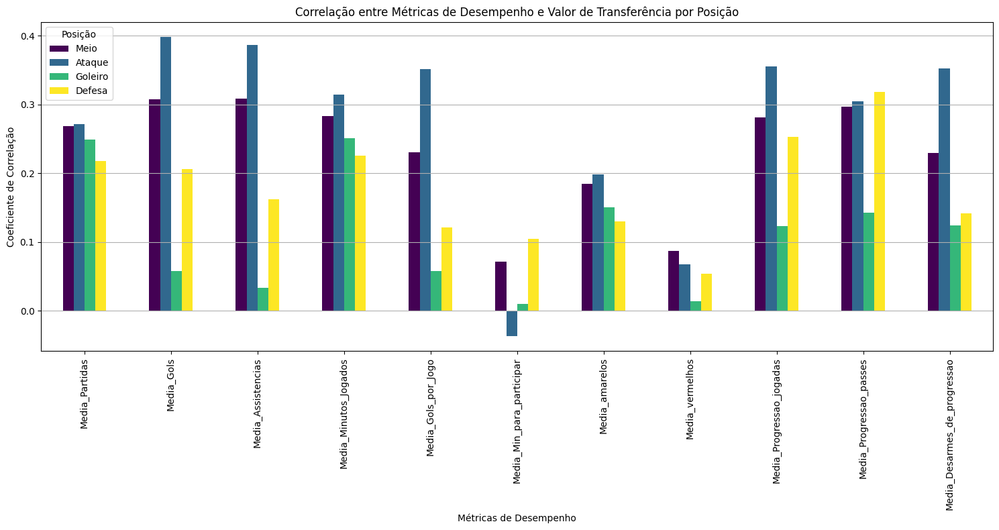

In [26]:
# Lista de posições reclassificadas
positions = df['Posicao_Reclassificada'].unique()

# Lista de métricas a serem analisadas
metrics = ['Media_Partidas', 'Media_Gols', 'Media_Assistencias', 'Media_Minutos_Jogados',
           'Media_Gols_por_Jogo', 'Media_Min_para_participar', 'Media_amarelos',
           'Media_vermelhos', 'Media_Progressao_jogadas', 'Media_Progressao_passes',
           'Media_Desarmes_de_progressao']

correlation_data = {}

# Calcular a correlação para cada posição
for position in positions:
    subset = df[df['Posicao_Reclassificada'] == position]
    correlations = subset[metrics + ['Valor_Transferencia']].corr()['Valor_Transferencia'].drop('Valor_Transferencia')
    correlation_data[position] = correlations

# Transformar o dicionário em um DataFrame
correlation_df = pd.DataFrame(correlation_data)

# Plotar os resultados
correlation_df.plot(kind='bar', figsize=(15, 8), colormap='viridis')
plt.title("Correlação entre Métricas de Desempenho e Valor de Transferência por Posição")
plt.ylabel("Coeficiente de Correlação")
plt.xlabel("Métricas de Desempenho")
plt.grid(axis='y')
plt.legend(title="Posição")
plt.tight_layout()
plt.show()



* **Meio-Campistas (Meio)**:

Métricas como Media_Partidas, Media_Gols, Media_Assistencias, Media_Minutos_Jogados, Media_Progressao_jogadas e Media_Progressao_passes têm as maiores correlações positivas. Isso sugere que jogadores de meio-campo que jogam regularmente, que marcam e assistem, e que contribuem para a progressão da bola, tendem a ter um maior valor de transferência. Esses resultados estão alinhados com a análise anterior, onde a participação direta em gols e a regularidade de jogo são valiosas no mercado de transferências.

O baixo valor de correlação para Media_Min_para_participar sugere que, para meio-campistas, a quantidade de minutos jogados para participar diretamente de um gol (seja marcando ou assistindo) não é uma métrica tão influente para determinar seu valor de transferência.

* **Atacantes (Ataque)**:

Media_Gols e Media_Assistencias têm as maiores correlações positivas. Isso faz sentido, pois espera-se que atacantes tenham um impacto direto nos gols, e sua capacidade de marcar e fornecer assistências é altamente valorizada.

Media_Gols_por_Jogo e Media_Progressao_jogadas também mostram correlações significativas, reforçando a ideia de que eficiência e envolvimento no ataque são cruciais para atacantes.

É interessante observar que Media_Min_para_participar tem uma correlação negativa, embora pequena. Isso pode indicar que, para atacantes, demorar mais para contribuir para um gol pode de fato reduzir ligeiramente seu valor de transferência, ao contrário de meio-campistas.

* **Goleiros (Goleiro)**:

Media_Partidas e Media_Minutos_Jogados têm as maiores correlações. Isso sugere que goleiros que jogam regularmente e que têm muitos minutos de jogo são mais valorizados. A correlação menor para métricas de gols e assistências é esperada, uma vez que goleiros raramente contribuem diretamente para gols.

Media_Desarmes_de_progressao tem uma correlação positiva moderada, o que pode indicar que goleiros que são bons em interceptar ou desarmar jogadas em progressão são mais valorizados.

* **Defensores (Defesa)**:

Media_Progressao_passes tem a maior correlação positiva. Isso sugere que defensores que são capazes de iniciar ataques ou contribuir para a progressão da bola no campo são altamente valorizados.

Media_Gols e Media_Partidas também têm correlações positivas, indicando que defensores que marcam gols (talvez em situações de bola parada) e que têm regularidade de jogo são mais valorizados.

# Conclusões:

Ao longo desta análise, exploramos a relação entre as métricas de desempenho e performance e os valores de transferência dos jogadores. A análise de regressão proporcionou uma compreensão detalhada da influência de métricas individuais no valor de transferência, enquanto a análise de correlação permitiu avaliar a força e a direção das associações entre as métricas e os valores de transferência, segmentados por posição.

Podemos concluir que métricas relacionadas diretamente à produção ofensiva, como gols e assistências, geralmente têm um impacto significativo e positivo no valor de transferência de um jogador, independentemente da posição. Entretanto, a relação entre outras métricas e o valor de transferência pode variar significativamente dependendo da posição em questão e do contexto tático. Por exemplo, a eficácia de um atacante em participar diretamente em gols é crucial, enquanto a mesma métrica pode não ser tão influente para meio-campistas ou defensores, que podem ter papéis mais variados em campo.

No entanto, apesar das descobertas significativas, é evidente que a avaliação do valor de transferência de um jogador no mundo do futebol é uma tarefa complexa, influenciada por uma infinidade de fatores, muitos dos quais podem ser intangíveis ou difíceis de quantificar. Os modelos elaborados, embora informativos, não capturam essa complexidade em sua totalidade.

Para melhorar e aprimorar esta análise no futuro, considerações adicionais podem incluir:

* Incorporação de métricas adicionais relacionadas à forma física, técnica, e tática do jogador;

* Consideração de fatores externos, como a reputação do jogador, lesões anteriores e o contexto econômico do mercado de transferências;

* Utilização de técnicas de modelagem mais avançadas que possam capturar interações entre as métricas, usando abordagens como regressões multiplas ao invés de simples regressões lineares;

* Análise de jogadores em ligas e competições específicas para obter insights mais focados;

* Inclusão de outras ligas para análise na Europa e na América do Sul;

* Expansão do dataset, incluindo dados de performance em campeonatos internacionais, como Champions League, Europa League, Conference League, além dos dados de desempenho por seleções.

Por fim, por mais que as métricas quantitativas de desempenho e performance ofereçam uma visão valiosa sobre o *business* do futebol, a avaliação dos jogadores, não apenas no âmbito financeiro, também requer uma compreensão profunda do jogo, intuição, experiência e outros elementos que vão muito além dos números. Todos esses componentes são apenas parte do todo que fazem o futebol ser o esporte mais apaixonante e imprevisivel (e divertido) do mundo inteiro.
